[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mlvlab/COSE474_2024/blob/main/3_Object_Detection_and_Multiple_Object_Tracking.ipynb)

# **Lab Session 3. Object Detection and Multiple Object Tracking**

**Contents**
1. Preparation
2. Object Detection
3. Multiple Object Tracking
4. Homework

**Reference**
*   End-to-End Object Detection with Transformers (DETR): https://github.com/facebookresearch/detr
*   Multi-Object Tracking by Associating Every Detection Box (ByteTrack): https://github.com/ifzhang/ByteTrack





## **I. Preparation**
* In this section, you will mount your Google Drive and create extra space for this tutorial.













In [ ]:
from google.colab import drive
root = '/content/drive/'
drive.mount(root)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import os

# Set the root directory
root = "/content/drive/"  # Set according to Google Drive path (usually /content/drive/ in Colab)

# Create COSE474 directory
cose474_path = os.path.join(root, "My Drive/Colab Notebooks/COSE474")
os.makedirs(cose474_path, exist_ok=True)

# Create Object_Detection directory
od_path = os.path.join(cose474_path, "Object_Detection")
os.makedirs(od_path, exist_ok=True)

# Navigate to Object_Detection directory
%cd "{od_path}"

/content/drive/My Drive/Colab Notebooks/COSE474/Object_Detection





### **1. Install dependencies**








In [ ]:
# Install Dependencies
!pip3 uninstall torch torchvision torchaudio -y
!pip3 install torch==1.13.0 torchvision==0.14.0 torchaudio==0.13.0
!pip3 install cython
!pip3 install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip3 install cython_bbox
!pip3 install matplotlib
!pip3 install lapx

# Git clone: ByteTrack (ECCV 2022)
!git clone https://github.com/ifzhang/ByteTrack.git
%cd ByteTrack

# == Install dependencies ==
# == Update 'requirements.txt' Before Installation ==
with open("requirements.txt", "r") as f:
    lines = f.readlines()

# == Modify 'requirements.txt' ==
with open("requirements.txt", "w") as f:
    for line in lines:
        # Remove 'lap' and any old 'onnx' version if they exist
        if 'lap' not in line.strip() and 'onnx' not in line.strip():
            f.write(line)

    # Add the new ONNX-related dependencies
    f.write("\nonnx==1.13.0\n")
    f.write("onnxruntime==1.13.1\n")
    f.write("onnx-simplifier==0.3.5\n")

# == Install Dependencies from Updated 'requirements.txt' ==
!pip3 install -r requirements.txt

# == Install ByteTrack ==
!python3 setup.py develop

Found existing installation: torch 2.5.0+cu121
Uninstalling torch-2.5.0+cu121:
  Successfully uninstalled torch-2.5.0+cu121
Found existing installation: torchvision 0.20.0+cu121
Uninstalling torchvision-0.20.0+cu121:
  Successfully uninstalled torchvision-0.20.0+cu121
Found existing installation: torchaudio 2.5.0+cu121
Uninstalling torchaudio-2.5.0+cu121:
  Successfully uninstalled torchaudio-2.5.0+cu121
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 890.1/890.1 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.3/24.3 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 97.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 48.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 3.2 MB/s eta 0:00:00
  Cloning https://github.com/cocodat




### **2. Download data**


* Download the image and video data for the practical exercise.








In [ ]:
%cd "{od_path}"

# make directory for input data
DATA_PATH = "data"
%mkdir "{DATA_PATH}"

# download sample image, video data
!wget -P "{DATA_PATH}" https://raw.githubusercontent.com/mlvlab/COSE474_2024/main/sample_data/dog.png
!wget -P "{DATA_PATH}" https://raw.githubusercontent.com/mlvlab/COSE474_2024/main/sample_data/dog.mp4

# make directory for output data
OUTPUT_PATH = "output"
%mkdir "{OUTPUT_PATH}"

/content/drive/My Drive/Colab Notebooks/COSE474/Object_Detection
--2024-11-01 02:35:57--  https://raw.githubusercontent.com/mlvlab/COSE474_2024/main/sample_data/dog.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8784826 (8.4M) [application/octet-stream]
Saving to: ‘data/dog.png’

dog.png             100%[===================>]   8.38M  --.-KB/s    in 0.1s    

2024-11-01 02:35:58 (64.4 MB/s) - ‘data/dog.png’ saved [8784826/8784826]

--2024-11-01 02:35:58--  https://raw.githubusercontent.com/mlvlab/COSE474_2024/main/sample_data/dog.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected

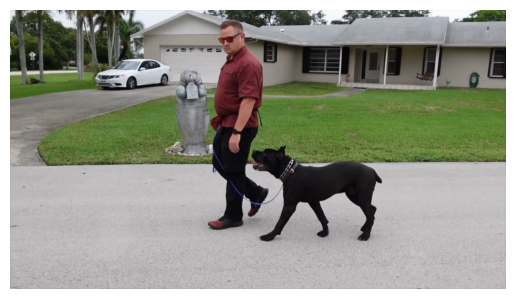

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
img_ex_path = "data/dog.png"
img_ex = Image.open(img_ex_path).convert('RGB')
plt.imshow(img_ex)
plt.axis('off')
plt.show()





## **II. Object Detection**

* In this section, we will perform object detection on image using DETR *(ECCV20)*.









### **0. Setup**

In [ ]:
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);

### **1. Pre & Post Processing**

In [ ]:
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

# rescale bounding boxes from normalized coordinates to the original image size.
def rescale_bboxes(out_bbox, size, device):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    scale_factors = torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32, device=device)
    b = b * scale_factors
    return b


### **2. Load Pre-trained DETR**

In [ ]:
class DETR(nn.Module):
    def __init__(self, num_classes, hidden_dim=256, nheads=8,
                 num_encoder_layers=6, num_decoder_layers=6):
        super().__init__()

        # create ResNet-50 backbone
        self.backbone = resnet50()
        del self.backbone.fc

        # create conversion layer
        self.conv = nn.Conv2d(2048, hidden_dim, 1)

        # create a default PyTorch transformer
        self.transformer = nn.Transformer(
            hidden_dim, nheads, num_encoder_layers, num_decoder_layers)

        # prediction heads, one extra class for predicting non-empty slots
        # note that in baseline DETR linear_bbox layer is 3-layer MLP
        self.linear_class = nn.Linear(hidden_dim, num_classes + 1)
        self.linear_bbox = nn.Linear(hidden_dim, 4)

        # output positional encodings (object queries)
        self.query_pos = nn.Parameter(torch.rand(100, hidden_dim))

        # spatial positional encodings
        # note that in baseline DETR we use sine positional encodings
        self.row_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))
        self.col_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))

    def forward(self, inputs):
        # propagate inputs through ResNet-50 up to avg-pool layer
        x = self.backbone.conv1(inputs)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        # convert from 2048 to 256 feature planes for the transformer
        h = self.conv(x)

        # construct positional encodings
        H, W = h.shape[-2:]
        pos = torch.cat([
            self.col_embed[:W].unsqueeze(0).repeat(H, 1, 1),
            self.row_embed[:H].unsqueeze(1).repeat(1, W, 1),
        ], dim=-1).flatten(0, 1).unsqueeze(1)

        # propagate through the transformer
        h = self.transformer(pos + 0.1 * h.flatten(2).permute(2, 0, 1),
                             self.query_pos.unsqueeze(1)).transpose(0, 1)

        # finally project transformer outputs to class labels and bounding boxes
        return {'pred_logits': self.linear_class(h),
                'pred_boxes': self.linear_bbox(h).sigmoid()}

In [ ]:
# a function to load the DETR model with pretrained weights and set it to evaluation mode.
def load_detr_model(num_classes=91,
                    pretrained_url='https://dl.fbaipublicfiles.com/detr/detr_demo-da2a99e9.pth'):

    # Set the device (use CUDA if available, otherwise CPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize the DETR model
    model = DETR(num_classes=num_classes)

    # Load pretrained weights
    state_dict = torch.hub.load_state_dict_from_url(
        url=pretrained_url, map_location=device, check_hash=True
    )

    # Load the state dictionary into the model
    model.load_state_dict(state_dict)

    # Set the model to evaluation mode
    model.eval()

    # Move the model to the specified device
    model.to(device)

    return model

detr = load_detr_model()

Downloading: "https://dl.fbaipublicfiles.com/detr/detr_demo-da2a99e9.pth" to /root/.cache/torch/hub/checkpoints/detr_demo-da2a99e9.pth


  0%|          | 0.00/79.3M [00:00<?, ?B/s]

In [ ]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# Colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

### **3. Inference & Visualization**

In [ ]:
# detect objects in an image using the DETR model.
def detect(im, model, transform):
    # Set the device (use CUDA if available, otherwise CPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Move the input image to the same device as the model
    img = transform(im).unsqueeze(0).to(device)

    # Ensure the image size does not exceed 1600x1600
    assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600, \
        'The model only supports images up to 1600 pixels on each side.'

    # Propagate through the model
    outputs = model(img)

    # Keep only predictions with confidence > 0.8
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.8

    # Convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size, device)

    return probas[keep], bboxes_scaled

scores, boxes = detect(img_ex, detr, transform)

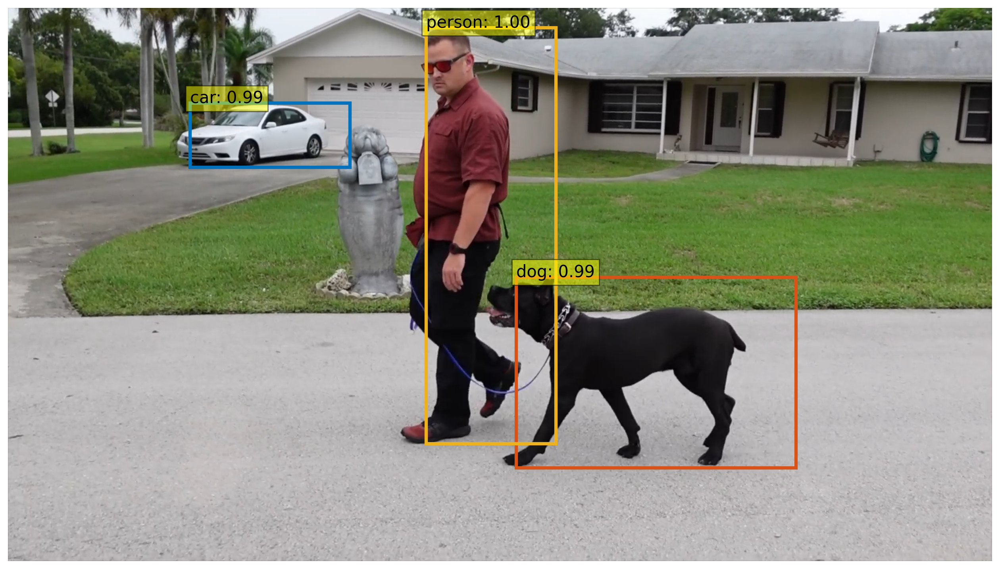

In [ ]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

plot_results(img_ex, scores, boxes)




## **III. Multiple Object Tracking**

* In this section, we will perform multiple object tracking on video using ByteTrack *(ECCV22)*.



### **0. Setup**

In [ ]:
%cd ByteTrack
from pathlib import Path
from loguru import logger
import cv2
import argparse
import sys
import torch
from torchvision.transforms import functional as F
from yolox.tracker.byte_tracker import BYTETracker
from yolox.tracking_utils.timer import Timer
import requests
import numpy as np
np.float = float
import matplotlib.pyplot as plt
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False)

/content/drive/MyDrive/Colab Notebooks/COSE474/Object_Detection/ByteTrack


In [ ]:
# ByteTrack argument parser
def make_parser():
    parser = argparse.ArgumentParser("ByteTrack")
    parser.add_argument("--demo", default="image", help="demo type, e.g., image, video, and webcam")
    parser.add_argument("-expn", "--experiment-name", type=str, default=None)
    parser.add_argument("-n", "--name", type=str, default=None, help="model name")

    # Video input and output paths
    parser.add_argument("--video_path", default="", help="path to input video")
    parser.add_argument("--output_path", default="", help="path to save output video")

    parser.add_argument("--camid", type=int, default=0, help="webcam demo camera ID")
    parser.add_argument("--save_result", action="store_true", help="save the inference result")

    # Experiment file and checkpoint
    parser.add_argument("-f", "--exp_file", type=str, help="experiment description file")
    parser.add_argument("-c", "--ckpt", type=str, help="checkpoint for evaluation")
    parser.add_argument("--device", default="gpu", type=str, help="device (cpu or gpu)")

    # Detection and tracking thresholds
    parser.add_argument("--detect_thresh", type=float, default=0.8, help="detection confidence threshold")
    parser.add_argument("--track_thresh", type=float, default=0.9, help="tracking confidence threshold")
    parser.add_argument("--track_buffer", type=int, default=100, help="frames to keep lost tracks")
    parser.add_argument("--match_thresh", type=float, default=0.9, help="matching threshold")

    # Additional settings
    parser.add_argument("--aspect_ratio_thresh", type=float, default=1.6, help="aspect ratio threshold")
    parser.add_argument("--min_box_area", type=float, default=1, help="filter tiny boxes")
    parser.add_argument("--mot20", action="store_true", help="test on MOT20 dataset")

    parser.add_argument("--fps", type=int, default=30, help="frame rate (fps)")
    parser.add_argument("--fp16", action="store_true", help="enable mixed precision")
    parser.add_argument("--fuse", action="store_true", help="fuse convolution and batch norm")
    parser.add_argument("--trt", action="store_true", help="use TensorRT for inference")

    return parser

In [ ]:
# For color visualization
COCO_CATEGORIES = [
    {"color": [], "isthing": 0, "id": 0, "name": "N/A"},
    {"color": [220, 20, 60], "isthing": 1, "id": 1, "name": "person"},
    {"color": [119, 11, 32], "isthing": 1, "id": 2, "name": "bicycle"},
    {"color": [0, 0, 142], "isthing": 1, "id": 3, "name": "car"},
    {"color": [0, 0, 230], "isthing": 1, "id": 4, "name": "motorcycle"},
    {"color": [106, 0, 228], "isthing": 1, "id": 5, "name": "airplane"},
    {"color": [0, 60, 100], "isthing": 1, "id": 6, "name": "bus"},
    {"color": [0, 80, 100], "isthing": 1, "id": 7, "name": "train"},
    {"color": [0, 0, 70], "isthing": 1, "id": 8, "name": "truck"},
    {"color": [0, 0, 192], "isthing": 1, "id": 9, "name": "boat"},
    {"color": [250, 170, 30], "isthing": 1, "id": 10, "name": "traffic light"},
    {"color": [100, 170, 30], "isthing": 1, "id": 11, "name": "fire hydrant"},
    {"color": [], "isthing": 0, "id": 12, "name": "N/A"},
    {"color": [220, 220, 0], "isthing": 1, "id": 13, "name": "stop sign"},
    {"color": [175, 116, 175], "isthing": 1, "id": 14, "name": "parking meter"},
    {"color": [250, 0, 30], "isthing": 1, "id": 15, "name": "bench"},
    {"color": [165, 11, 42], "isthing": 1, "id": 16, "name": "bird"},
    {"color": [222, 26, 252], "isthing": 1, "id": 17, "name": "cat"},
    {"color": [31, 33, 115], "isthing": 1, "id": 18, "name": "dog"},
    {"color": [82, 22, 115], "isthing": 1, "id": 19, "name": "horse"},
    {"color": [0, 82, 0], "isthing": 1, "id": 20, "name": "sheep"},
    {"color": [120, 166, 157], "isthing": 1, "id": 21, "name": "cow"},
    {"color": [110, 76, 0], "isthing": 1, "id": 22, "name": "elephant"},
    {"color": [174, 57, 255], "isthing": 1, "id": 23, "name": "bear"},
    {"color": [199, 100, 0], "isthing": 1, "id": 24, "name": "zebra"},
    {"color": [72, 0, 118], "isthing": 1, "id": 25, "name": "giraffe"},
    {"color": [], "isthing": 0, "id": 26, "name": "N/A"},
    {"color": [255, 179, 240], "isthing": 1, "id": 27, "name": "backpack"},
    {"color": [0, 125, 92], "isthing": 1, "id": 28, "name": "umbrella"},
    {"color": [], "isthing": 0, "id": 29, "name": "N/A"},
    {"color": [], "isthing": 0, "id": 30, "name": "N/A"},
    {"color": [209, 0, 151], "isthing": 1, "id": 31, "name": "handbag"},
    {"color": [188, 208, 182], "isthing": 1, "id": 32, "name": "tie"},
    {"color": [0, 220, 176], "isthing": 1, "id": 33, "name": "suitcase"},
    {"color": [255, 99, 164], "isthing": 1, "id": 34, "name": "frisbee"},
    {"color": [92, 0, 73], "isthing": 1, "id": 35, "name": "skis"},
    {"color": [133, 129, 255], "isthing": 1, "id": 36, "name": "snowboard"},
    {"color": [78, 180, 255], "isthing": 1, "id": 37, "name": "sports ball"},
    {"color": [0, 228, 0], "isthing": 1, "id": 38, "name": "kite"},
    {"color": [174, 255, 243], "isthing": 1, "id": 39, "name": "baseball bat"},
    {"color": [45, 89, 255], "isthing": 1, "id": 40, "name": "baseball glove"},
    {"color": [134, 134, 103], "isthing": 1, "id": 41, "name": "skateboard"},
    {"color": [145, 148, 174], "isthing": 1, "id": 42, "name": "surfboard"},
    {"color": [255, 208, 186], "isthing": 1, "id": 43, "name": "tennis racket"},
    {"color": [197, 226, 255], "isthing": 1, "id": 44, "name": "bottle"},
    {"color": [], "isthing": 0, "id": 45, "name": "N/A"},
    {"color": [171, 134, 1], "isthing": 1, "id": 46, "name": "wine glass"},
    {"color": [109, 63, 54], "isthing": 1, "id": 47, "name": "cup"},
    {"color": [207, 138, 255], "isthing": 1, "id": 48, "name": "fork"},
    {"color": [151, 0, 95], "isthing": 1, "id": 49, "name": "knife"},
    {"color": [9, 80, 61], "isthing": 1, "id": 50, "name": "spoon"},
    {"color": [84, 105, 51], "isthing": 1, "id": 51, "name": "bowl"},
    {"color": [74, 65, 105], "isthing": 1, "id": 52, "name": "banana"},
    {"color": [166, 196, 102], "isthing": 1, "id": 53, "name": "apple"},
    {"color": [208, 195, 210], "isthing": 1, "id": 54, "name": "sandwich"},
    {"color": [255, 109, 65], "isthing": 1, "id": 55, "name": "orange"},
    {"color": [0, 143, 149], "isthing": 1, "id": 56, "name": "broccoli"},
    {"color": [179, 0, 194], "isthing": 1, "id": 57, "name": "carrot"},
    {"color": [209, 99, 106], "isthing": 1, "id": 58, "name": "hot dog"},
    {"color": [5, 121, 0], "isthing": 1, "id": 59, "name": "pizza"},
    {"color": [0, 165, 120], "isthing": 1, "id": 60, "name": "donut"},
    {"color": [147, 186, 208], "isthing": 1, "id": 61, "name": "cake"},
    {"color": [153, 69, 1], "isthing": 1, "id": 62, "name": "chair"},
    {"color": [3, 95, 161], "isthing": 1, "id": 63, "name": "couch"},
    {"color": [163, 255, 0], "isthing": 1, "id": 64, "name": "potted plant"},
    {"color": [119, 0, 170], "isthing": 1, "id": 65, "name": "bed"},
    {"color": [], "isthing": 0, "id": 66, "name": "N/A"},
    {"color": [0, 182, 199], "isthing": 1, "id": 67, "name": "dining table"},
    {"color": [], "isthing": 0, "id": 68, "name": "N/A"},
    {"color": [], "isthing": 0, "id": 69, "name": "N/A"},
    {"color": [227, 255, 205], "isthing": 1, "id": 70, "name": "toilet"},
    {"color": [], "isthing": 0, "id": 71, "name": "N/A"},
    {"color": [183, 130, 88], "isthing": 1, "id": 72, "name": "tv"},
    {"color": [95, 32, 0], "isthing": 1, "id": 73, "name": "laptop"},
    {"color": [130, 114, 135], "isthing": 1, "id": 74, "name": "mouse"},
    {"color": [110, 129, 133], "isthing": 1, "id": 75, "name": "remote"},
    {"color": [166, 74, 118], "isthing": 1, "id": 76, "name": "keyboard"},
    {"color": [219, 142, 185], "isthing": 1, "id": 77, "name": "cell phone"},
    {"color": [79, 210, 114], "isthing": 1, "id": 78, "name": "microwave"},
    {"color": [178, 90, 62], "isthing": 1, "id": 79, "name": "oven"},
    {"color": [65, 70, 15], "isthing": 1, "id": 80, "name": "toaster"},
    {"color": [127, 167, 115], "isthing": 1, "id": 81, "name": "sink"},
    {"color": [59, 105, 106], "isthing": 1, "id": 82, "name": "refrigerator"},
    {"color": [], "isthing": 0, "id": 83, "name": "N/A"},
    {"color": [142, 108, 45], "isthing": 1, "id": 84, "name": "book"},
    {"color": [196, 172, 0], "isthing": 1, "id": 85, "name": "clock"},
    {"color": [95, 54, 80], "isthing": 1, "id": 86, "name": "vase"},
    {"color": [128, 76, 255], "isthing": 1, "id": 87, "name": "scissors"},
    {"color": [201, 57, 1], "isthing": 1, "id": 88, "name": "teddy bear"},
    {"color": [246, 0, 122], "isthing": 1, "id": 89, "name": "hair drier"},
    {"color": [191, 162, 208], "isthing": 1, "id": 90, "name": "toothbrush"},
]

def _get_coco_instances_meta():
    thing_ids = [k["id"] for k in COCO_CATEGORIES if k["isthing"] == 1]

    thing_dataset_id_to_contiguous_id = {k: i for i, k in enumerate(thing_ids)}
    thing_classes = [k["name"] for k in COCO_CATEGORIES if k["isthing"] == 1]
    thing_colors = [k["color"] for k in COCO_CATEGORIES if k["isthing"] == 1]
    coco_classes = [k["name"] for k in COCO_CATEGORIES]

    return {
        "thing_dataset_id_to_contiguous_id": thing_dataset_id_to_contiguous_id,
        "thing_classes": thing_classes,
        "thing_colors": thing_colors,
        "coco_classes": coco_classes,
    }

### **1. Pre & Post Processing**

In [ ]:
# Convert (cx, cy, w, h) -> (xmin, ymin, xmax, ymax)
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)  # Unbind the center coordinates and dimensions
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]  # Calculate corner coordinates
    return torch.stack(b, dim=1)

# Rescale bounding boxes to match the original image size
def rescale_bboxes(out_bbox, size, device):
    img_w, img_h = size  # Original image width and height
    b = box_cxcywh_to_xyxy(out_bbox)  # Convert bounding boxes to corner coordinates
    return b * torch.tensor([img_w, img_h, img_w, img_h], device=out_bbox.device)

# Run DETR detection on a single frame
def detect_with_detr(confidence, img_pil, model, device):
    img = transform(img_pil).unsqueeze(0).to(device)  # Transform and move to the device
    outputs = model(img)  # Perform inference

    # Extract probabilities and apply confidence threshold
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]  # Class probabilities
    keep = probas.max(-1).values > confidence  # Keep predictions above confidence threshold

    # Rescale bounding boxes to original image size
    bboxes = rescale_bboxes(outputs['pred_boxes'][0, keep], img_pil.size, device)
    return probas[keep], bboxes  # Return filtered probabilities and bounding boxes

# Convert DETR outputs to BYTETracker-compatible format
def convert_to_tracker_format(probas, bboxes, device):

    # Extract scores from probas (N, 1)
    scores = probas.max(dim=-1).values.unsqueeze(1).to(device)

    # Move bboxes and detection indices to the same device
    bboxes = bboxes.to(device)
    det_idxs = torch.arange(len(bboxes), device=device).unsqueeze(1).int()

    # Concatenate tensors (all on the same device) and return (N, 6)
    return torch.cat([bboxes, scores, det_idxs], dim=1)

### **2. Inference & Visualization**

In [ ]:
# Visualize detections and tracking results on the frame
def visualize_tracking(frame, probas, bboxes, online_targets, color_map):

    vis_frame = frame.copy()  # Create a copy of the frame
    for target, p, (xmin, ymin, xmax, ymax) in zip(online_targets, probas, bboxes.tolist()):
        # Display class and score
        cl = p.argmax()  # Predicted class index
        object_text = CLASSES[cl]  # Class name
        label = f"{object_text}: {p[cl]:0.2f} | ID: {target.track_id}"  # Label with class, score, and ID
        color = color_map[int(cl.item()) - 1]  # Color for the bounding box

        # Draw bounding box
        cv2.rectangle(
            vis_frame, (int(xmin), int(ymin)), (int(xmax), int(ymax)),
            color, 2  # Thickness of 2
        )

        # Adjust text position and add background for clarity
        text_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        text_x, text_y = int(xmin), int(ymin) - 10
        cv2.rectangle(vis_frame, (text_x, text_y - 10),
                      (text_x + text_size[0], text_y + text_size[1] - 5),
                      color, -1)  # Text background

        # Draw the text (in white)
        cv2.putText(vis_frame, label, (text_x, text_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    return vis_frame  # Return the visualized frame

# Process video for detection and tracking
def process_video(args, video_path, detr, color_map, device):

    # Initialize video capture
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        logger.error(f"Cannot open video: {video_path}")
        return

    # Configure video output settings
    output_path = args.save_path
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS) or 30  # Default to 30 FPS if unavailable
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    # Initialize BYTETracker
    tracker = BYTETracker(args, frame_rate=30)
    frame_id = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break  # End of video

        frame_id += 1
        img_pil = F.to_pil_image(frame[..., ::-1])  # Convert BGR to RGB for PIL

        # Perform DETR detection
        probas, bboxes = detect_with_detr(args.detect_thresh, img_pil, detr, device)
        dets = convert_to_tracker_format(probas, bboxes, device)

        if dets.shape[0] == 0:
            logger.info(f"Frame {frame_id}: No detections.")
            out.write(frame)  # Save the original frame
            continue

        # Update BYTETracker with detections
        online_targets = tracker.update(
            dets, (frame.shape[0], frame.shape[1]), (frame.shape[1], frame.shape[0])
        )

        # Visualize tracking results
        vis_frame = visualize_tracking(frame, probas, bboxes, online_targets, color_map)

        # Save the visualized frame to the output video
        out.write(vis_frame)

    # Release resources
    cap.release()
    out.release()
    logger.info(f"Tracking video saved to {output_path}")
    return


In [ ]:
def main(args):
    # Set device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Initialize DETR model
    detr = DETR(num_classes=91)
    state_dict = torch.hub.load_state_dict_from_url(
        url='https://dl.fbaipublicfiles.com/detr/detr_demo-da2a99e9.pth',
        map_location=device, check_hash=True
    )
    detr.load_state_dict(state_dict)
    detr.to(device)
    detr.eval()

    # Define transformation
    transform = T.Compose([
        T.Resize(800),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    # Prepare video path and color map
    video_path = args.video_path
    color_map = _get_coco_instances_meta()['thing_colors']

    # Process the video
    process_video(args, video_path, detr, color_map, device)
    return

In [ ]:
# Parse command-line arguments
args = make_parser().parse_args()

# Define video file name
VIDEO_NAME = "dog.mp4"

# Set video input and output paths
args.video_path = os.path.join(od_path, "data", VIDEO_NAME)  # Input video path
args.save_path = os.path.join(od_path, "output", VIDEO_NAME)  # Output video path

# Set detection and tracking thresholds
args.detect_thresh = 0.8  # Object detection confidence threshold
args.track_thresh = 0.8   # Object tracking confidence threshold
args.track_buffer = 500   # Frames to keep lost tracks
args.match_thresh = 0.8   # Matching threshold for tracking

# Run the main function
main(args)

2024-11-01 02:37:49.116 | INFO     | __main__:process_video:83 - Tracking video saved to /content/drive/My Drive/Colab Notebooks/COSE474/Object_Detection/output/dog.mp4






## **IV. Homework**

* This homework focuses on understanding and applying DETR for object detection and attention visualization. It consists of three questions designed to assess both theoretical understanding and practical application.

* Please organize your answers (or captured image) and results for the questions below and submit them as a **.pdf file.**



### **Q1.  Understanding DETR model**

* Fill-in-the-blank exercise to test your understanding of critical parts of the DETR model workflow.



In [ ]:
class DETR(nn.Module):
    def __init__(self, num_classes, hidden_dim=256, nheads=8,
                 num_encoder_layers=6, num_decoder_layers=6, num_queries=100):
        super().__init__()

        # create ResNet-50 backbone
        self.backbone = resnet50()
        del self.backbone.fc

        # create conversion layer
        self.conv = nn.Conv2d(2048, hidden_dim, 1)

        # create a default PyTorch transformer
        self.transformer = nn.Transformer(
            hidden_dim, nheads, _______, _______)

        # prediction heads, one extra class for predicting non-empty slots
        # note that in baseline DETR linear_bbox layer is 3-layer MLP
        self.linear_class = nn.Linear(hidden_dim, _______ + 1)
        self.linear_bbox = nn.Linear(hidden_dim, 4)

        # output positional encodings (object queries)
        self.query_pos = nn.Parameter(torch.rand(_______, _______))

        # spatial positional encodings
        # note that in baseline DETR we use sine positional encodings
        self.row_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))
        self.col_embed = nn.Parameter(torch.rand(50, hidden_dim // 2))

    def forward(self, inputs):
        # propagate inputs through ResNet-50 up to avg-pool layer
        x = self.backbone.conv1(inputs)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        # convert from 2048 to 256 feature planes for the transformer
        h = self.conv(x)

        # construct positional encodings
        H, W = h.shape[-2:]
        pos = torch.cat([
            self.col_embed[:W].unsqueeze(0).repeat(H, 1, 1),
            self.row_embed[:H].unsqueeze(1).repeat(1, W, 1),
        ], dim=-1).flatten(0, 1).unsqueeze(1)

        # propagate through the transformer
        h = self.transformer(pos + 0.1 * h.flatten(2).permute(2, 0, 1),
                             self.query_pos.unsqueeze(1)).transpose(0, 1)



        # finally project transformer outputs to class labels and bounding boxes
        pred_logits = _______
        pred_boxes = _______

        return {'pred_logits': pred_logits,
                'pred_boxes': pred_boxes}

### **Q2. Custom Image Detection and Attention Visualization**

In this task, you will upload an **image of your choice** (different from the provided sample) and follow the steps below:

* Object Detection using DETR
 * Use the DETR model to detect objects in your uploaded image.

* Attention Visualization in Encoder
 * Visualize the regions of the image where the encoder focuses the most.

* Decoder Query Attention in Decoder
 * Visualize how the decoder’s query attends to specific areas corresponding to the detected objects.



This section contains the boilerplate necessary for the other sections. Run it first.

In [ ]:
import math

from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import ipywidgets as widgets
from IPython.display import display, clear_output

import torch
from torch import nn


from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);

# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()




In this section, we show-case how to load a model from hub, run it on a custom image, and print the result.
Here we load the simplest model (DETR-R50) for fast inference. You can swap it with any other model from the model zoo.

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


  0%|          | 0.00/159M [00:00<?, ?B/s]

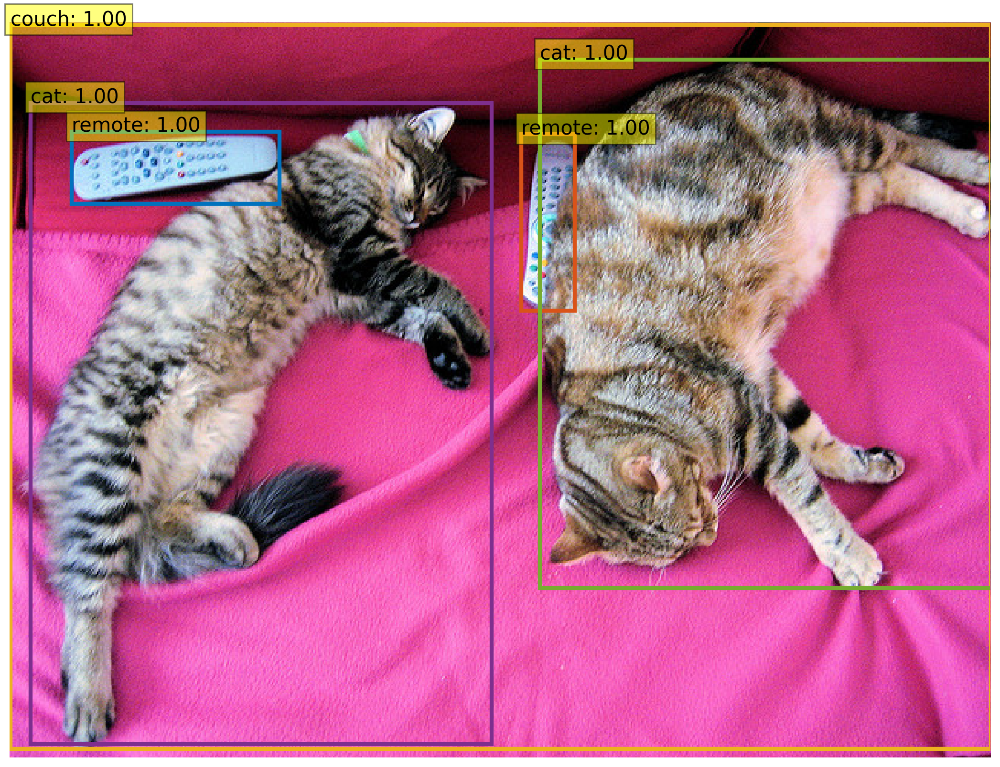

In [ ]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval();

url = 'http://images.cocodataset.org/val2017/000000039769.jpg'
im = Image.open(requests.get(url, stream=True).raw) # put your own image

# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img)

# keep only predictions with 0.7+ confidence
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img)

# keep only predictions with 0.7+ confidence
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

# mean-std normalize the input image (batch-size: 1)
img = transform(im).unsqueeze(0)

# propagate through the model
outputs = model(img)

# keep only predictions with 0.7+ confidence
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.9

# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

plot_results(im, probas[keep], bboxes_scaled)


Here we visualize attention weights of the last decoder layer. This corresponds to visualizing, for each detected objects, which part of the image the model was looking at to predict this specific bounding box and class.

In [ ]:
# use lists to store the outputs via up-values
conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
    model.backbone[-2].register_forward_hook(
        lambda self, input, output: conv_features.append(output)
    ),
    model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        lambda self, input, output: enc_attn_weights.append(output[1])
    ),
    model.transformer.decoder.layers[-1].multihead_attn.register_forward_hook(
        lambda self, input, output: dec_attn_weights.append(output[1])
    ),
]

# propagate through the model
outputs = model(img) # put your own image

for hook in hooks:
    hook.remove()

# don't need the list anymore
conv_features = conv_features[0]
enc_attn_weights = enc_attn_weights[0]
dec_attn_weights = dec_attn_weights[0]

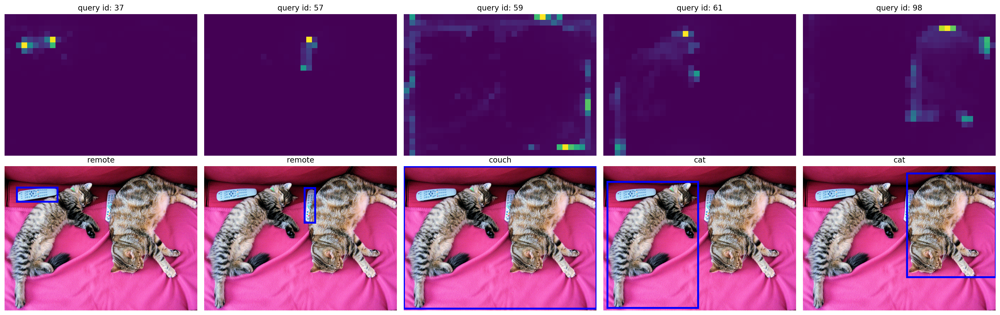

In [ ]:
# get the feature map shape
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 7))
colors = COLORS * 100
for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled):
    ax = ax_i[0]
    ax.imshow(dec_attn_weights[0, idx].view(h, w))
    ax.axis('off')
    ax.set_title(f'query id: {idx.item()}')
    ax = ax_i[1]
    ax.imshow(im)
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='blue', linewidth=3))
    ax.axis('off')
    ax.set_title(CLASSES[probas[idx].argmax()])
fig.tight_layout()

In [ ]:
# output of the CNN
f_map = conv_features['0']
print("Encoder attention:      ", enc_attn_weights[0].shape)
print("Feature map:            ", f_map.tensors.shape)

Encoder attention:       torch.Size([850, 850])
Feature map:             torch.Size([1, 2048, 25, 34])


In [ ]:
# get the HxW shape of the feature maps of the CNN
shape = f_map.tensors.shape[-2:]
# and reshape the self-attention to a more interpretable shape
sattn = enc_attn_weights[0].reshape(shape + shape)
print("Reshaped self-attention:", sattn.shape)

Reshaped self-attention: torch.Size([25, 34, 25, 34])


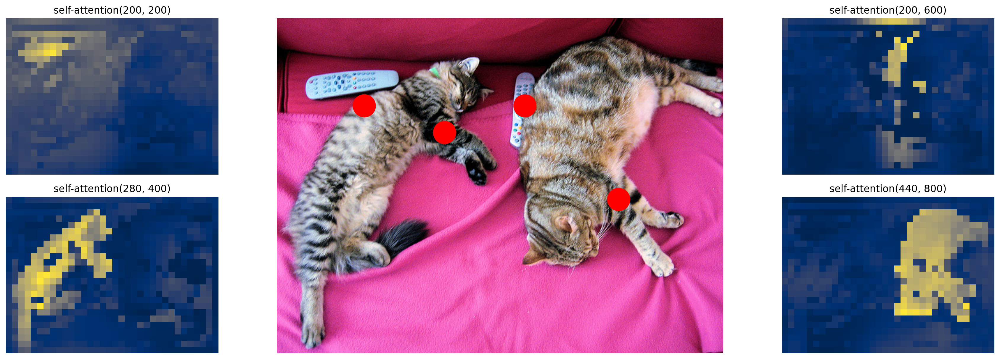

In [ ]:
# downsampling factor for the CNN, is 32 for DETR and 16 for DETR DC5
fact = 32

# let's select 4 reference points for visualization
idxs = [(200, 200), (280, 400), (200, 600), (440, 800),]

# here we create the canvas
fig = plt.figure(constrained_layout=True, figsize=(25 * 0.7, 8.5 * 0.7))
# and we add one plot per reference point
gs = fig.add_gridspec(2, 4)
axs = [
    fig.add_subplot(gs[0, 0]),
    fig.add_subplot(gs[1, 0]),
    fig.add_subplot(gs[0, -1]),
    fig.add_subplot(gs[1, -1]),
]

# for each one of the reference points, let's plot the self-attention
# for that point
for idx_o, ax in zip(idxs, axs):
    idx = (idx_o[0] // fact, idx_o[1] // fact)
    ax.imshow(sattn[..., idx[0], idx[1]], cmap='cividis', interpolation='nearest')
    ax.axis('off')
    ax.set_title(f'self-attention{idx_o}')

# and now let's add the central image, with the reference points as red circles
fcenter_ax = fig.add_subplot(gs[:, 1:-1])
fcenter_ax.imshow(im)
for (y, x) in idxs:
    scale = im.height / img.shape[-2]
    x = ((x // fact) + 0.5) * fact
    y = ((y // fact) + 0.5) * fact
    fcenter_ax.add_patch(plt.Circle((x * scale, y * scale), fact // 2, color='r'))
    fcenter_ax.axis('off')

### **Q3. Understanding Attention Mechanisms**

In this task, you focus on understanding the attention mechanisms present in the encoder and decoder of DETR.

* Briefly describe the types of attention used in the encoder and decoder, and explain the key differences between them.

* Based on the visualized results from Q2, provide an analysis of the distinct characteristics of each attention mechanism in the encoder and decoder. Feel free to express your insights.